In [1]:
import warnings

warnings.filterwarnings("ignore")

In [2]:
import matplotlib.font_manager as font_manager
from matplotlib import rcParams

# Add every font at the specified location
font_dir = ["../fonts"]
for font in font_manager.findSystemFonts(font_dir):
    font_manager.fontManager.addfont(font)

# Set font family globally
rcParams["font.family"] = "umr10"
rcParams["font.size"] = 16

In [3]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import geojson
from descartes import PolygonPatch
import ast
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scripts.graph_utilities import get_graph_for_bike

In [5]:
df_bicycle_dataset = pd.read_csv("../dataset/processed/processed_dataset.csv")
df_geo_location_bicycle_dataset = pd.read_csv(
    "../dataset/processed/processed_geolocation_dataset.csv"
)

In [6]:
df_bicycle_dataset.head()

,uid,bike_number,start_time,end_time,rental_place,return_place,duration
0,115274776,57992,2021-04-30 23:43:31,2021-05-01 00:00:36,Legnicka / Młodych Techników,Kozanowska / Pilczycka,18
1,115274973,57712,2021-04-30 23:51:27,2021-05-01 00:01:57,Kazimierza Wielkiego (Helios),Piaskowa / św. Ducha,11
2,115275228,650973,2021-05-01 00:00:55,2021-05-01 00:01:58,Wałbrzyska - pętla tramwajowa,Wałbrzyska - pętla tramwajowa,2
3,115274967,57314,2021-04-30 23:51:20,2021-05-01 00:01:59,Kazimierza Wielkiego (Helios),Piaskowa / św. Ducha,11
4,115274970,650158,2021-04-30 23:51:25,2021-05-01 00:02:07,Kazimierza Wielkiego (Helios),Piaskowa / św. Ducha,11


In [7]:
df_geo_location_bicycle_dataset.head()

,station_number,station_name,number_of_bikes_available,number_of_bikes_racks,latitude,longitude,coordinates
0,15001,Plac Dominikański (Galeria Dominikańska),14,16.0,51.108004,17.039528,"(17.039528, 51.108004)"
1,15002,"Dworzec Główny, południe",7,12.0,51.097108,17.036110,"(17.03611, 51.097108)"
2,15003,Rynek,43,16.0,51.109782,17.030175,"(17.030175, 51.109782)"
3,15004,Dworzec Główny,19,16.0,51.099750,17.036228,"(17.036228, 51.09975)"
4,15005,Nowowiejska / Jedności Narodowej,5,10.0,51.124879,17.045844,"(17.045844, 51.124879)"


In [8]:
graph = nx.from_pandas_edgelist(
    df_bicycle_dataset,
    source="rental_place",
    target="return_place",
    edge_attr="duration",
    create_using=nx.DiGraph(),
)

In [9]:
with open("../dataset/geojson/wroclaw.geojson") as json_file:
    json_data = geojson.load(json_file)

In [10]:
polygons = json_data["features"]

In [11]:
df_coordinates = df_geo_location_bicycle_dataset[["station_name", "coordinates"]]
df_coordinates = df_coordinates.set_index("station_name")
df_coordinates["coordinates"] = df_coordinates["coordinates"].apply(
    lambda x: ast.literal_eval(x)
)
stations_positions = df_coordinates.to_dict()["coordinates"]

In [12]:
BLUE = "#6699cc"

# Degree

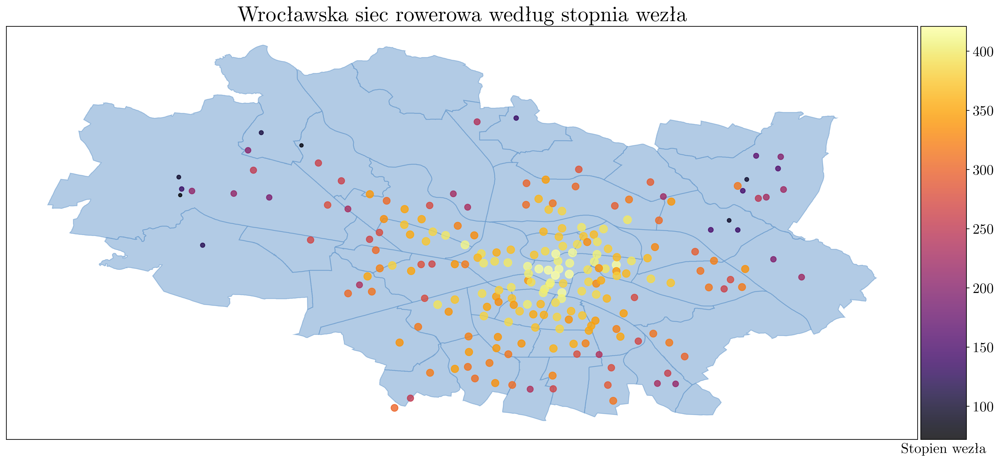

In [13]:
degrees = dict(nx.degree(graph))

fig = plt.figure(figsize=(16, 9), dpi=400)
plt.title("Wrocławska siec rowerowa według stopnia wezła", fontsize=24)
ax = fig.gca()

for i in range(len(polygons)):
    coordinates = polygons[i]["geometry"]["coordinates"]
    poly = {"type": "Polygon", "coordinates": coordinates}
    ax.add_patch(PolygonPatch(poly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2))
    ax.axis("scaled")

nodes_collection = nx.draw_networkx_nodes(
    G=graph,
    pos=stations_positions,
    nodelist=graph.nodes(),
    alpha=0.8,
    ax=ax,
    node_size=[0.2 * degrees[node] for node in graph.nodes()],
    node_color=[degrees[node] for node in graph.nodes()],
    cmap="inferno",
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

color_bar = plt.colorbar(nodes_collection, cax=cax)
color_bar.ax.set_xlabel("Stopien wezła")
plt.tight_layout()
plt.savefig(
    "../images/map/Wroclaw_bikes_network_degree.png",
    bbox_inches="tight",
    dpi=400,
)

In [14]:
sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:10]

[('Szewska / Kazimierza Wielkiego', 421),
 ('Plac Dominikański (Galeria Dominikańska)', 419),
 ('Rynek', 419),
 ('Kazimierza Wielkiego (Helios)', 418),
 ('Rondo Reagana', 418),
 ('Drobnera / Dubois', 417),
 ('Wita Stwosza / Szewska', 416),
 ('Dworzec Główny', 416),
 ('Drobnera / Plac Bema', 415),
 ('Plac Jana Pawła II (Akademia Muzyczna)', 412)]

# Closeness

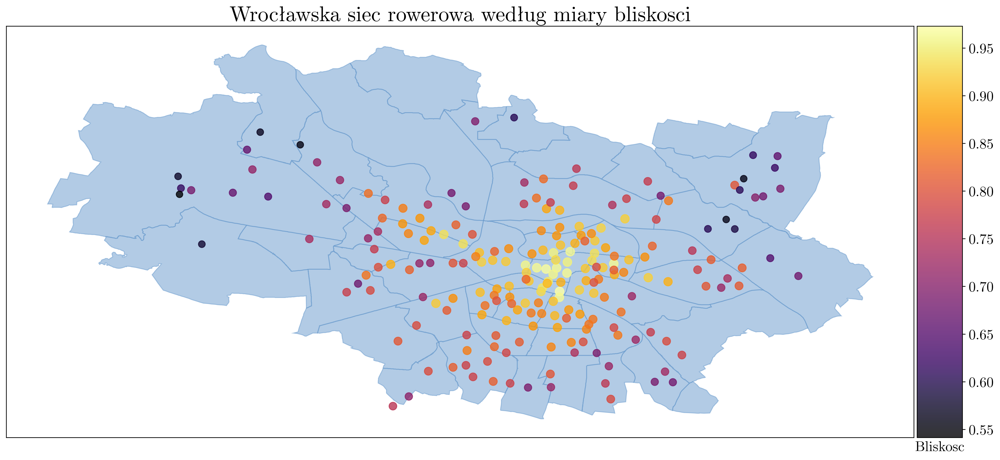

In [15]:
nodes_closeness_sorted = [
    n
    for n, v in sorted(
        nx.closeness_centrality(graph).items(), key=lambda x: x[1], reverse=True
    )
]
values_closeness_sorted = [
    v
    for n, v in sorted(
        nx.closeness_centrality(graph).items(), key=lambda x: x[1], reverse=True
    )
]

closeness_dict = dict(
    [
        (key, value)
        for i, (key, value) in enumerate(
            zip(nodes_closeness_sorted, values_closeness_sorted)
        )
    ]
)

fig = plt.figure(figsize=(16, 9), dpi=400)
plt.title("Wrocławska siec rowerowa według miary bliskosci", fontsize=24)
ax = fig.gca()

for i in range(len(polygons)):
    coordinates = polygons[i]["geometry"]["coordinates"]
    poly = {"type": "Polygon", "coordinates": coordinates}
    ax.add_patch(PolygonPatch(poly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2))
    ax.axis("scaled")

nodes_collection = nx.draw_networkx_nodes(
    G=graph,
    pos=stations_positions,
    nodelist=nodes_closeness_sorted,
    alpha=0.8,
    ax=ax,
    node_size=[100 * closeness_dict[node] for node in nodes_closeness_sorted],
    node_color=[closeness_dict[node] for node in nodes_closeness_sorted],
    cmap="inferno",
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

color_bar = plt.colorbar(nodes_collection, cax=cax)
color_bar.ax.set_xlabel("Bliskosc")
plt.tight_layout()
plt.savefig(
    "../images/map/Wroclaw_bikes_network_closeness.png",
    bbox_inches="tight",
    dpi=400,
)

In [16]:
sorted(closeness_dict.items(), key=lambda x: x[1], reverse=True)[:10]

[('Dworzec Główny', 0.9728506787330317),
 ('Rynek', 0.9684684684684685),
 ('Kazimierza Wielkiego (Helios)', 0.9641255605381166),
 ('Plac Dominikański (Galeria Dominikańska)', 0.9641255605381166),
 ('Wita Stwosza / Szewska', 0.9641255605381166),
 ('Rondo Reagana', 0.9641255605381166),
 ('Dworzec Główny, południe', 0.9641255605381166),
 ('Drobnera / Plac Bema', 0.9641255605381166),
 ('Plac Jana Pawła II (Akademia Muzyczna)', 0.9598214285714286),
 ('Szewska / Kazimierza Wielkiego', 0.9598214285714286)]

# Betweenness

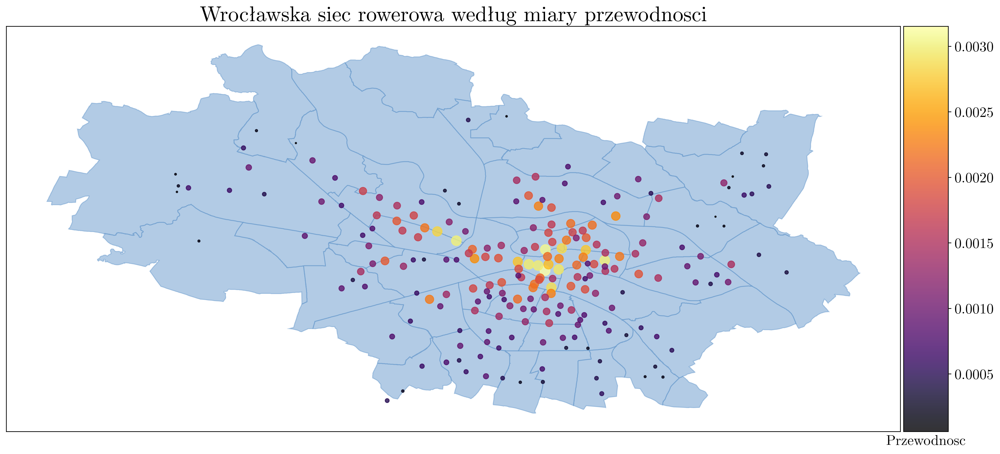

In [17]:
nodes_betweenness_sorted = [
    n
    for n, v in sorted(
        nx.betweenness_centrality(graph).items(), key=lambda x: x[1], reverse=True
    )
]
values_betweenness_sorted = [
    v
    for n, v in sorted(
        nx.betweenness_centrality(graph).items(), key=lambda x: x[1], reverse=True
    )
]

betweenness_dict = dict(
    [
        (key, value)
        for i, (key, value) in enumerate(
            zip(nodes_betweenness_sorted, values_betweenness_sorted)
        )
    ]
)

fig = plt.figure(figsize=(16, 9), dpi=400)
plt.title("Wrocławska siec rowerowa według miary przewodnosci", fontsize=24)
ax = fig.gca()

for i in range(len(polygons)):
    coordinates = polygons[i]["geometry"]["coordinates"]
    poly = {"type": "Polygon", "coordinates": coordinates}
    ax.add_patch(PolygonPatch(poly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2))
    ax.axis("scaled")

nodes_collection = nx.draw_networkx_nodes(
    G=graph,
    pos=stations_positions,
    nodelist=nodes_betweenness_sorted,
    alpha=0.8,
    ax=ax,
    node_size=[40_000 * betweenness_dict[node] for node in nodes_betweenness_sorted],
    node_color=[betweenness_dict[node] for node in nodes_betweenness_sorted],
    cmap="inferno",
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

color_bar = plt.colorbar(nodes_collection, cax=cax)
color_bar.ax.set_xlabel("Przewodnosc")
plt.tight_layout()
plt.savefig(
    "../images/map/Wroclaw_bikes_network_betweenness.png",
    bbox_inches="tight",
    dpi=400,
)

In [18]:
sorted(betweenness_dict.items(), key=lambda x: x[1], reverse=True)[:10]

[('Szewska / Kazimierza Wielkiego', 0.0031525045456112606),
 ('Drobnera / Dubois', 0.003073994038396185),
 ('Legnicka (Park Magnolia)', 0.003012931853947111),
 ('Rondo Reagana', 0.0030116098217083144),
 ('Rynek', 0.002990025780574981),
 ('Kazimierza Wielkiego (Helios)', 0.002971831639330489),
 ('Plac Dominikański (Galeria Dominikańska)', 0.002956114882879992),
 ('Dworzec Główny', 0.0028935414370258546),
 ('Drobnera / Plac Bema', 0.002869229227989127),
 ('Legnicka / Wejherowska', 0.0028356432210132967)]

# Availability

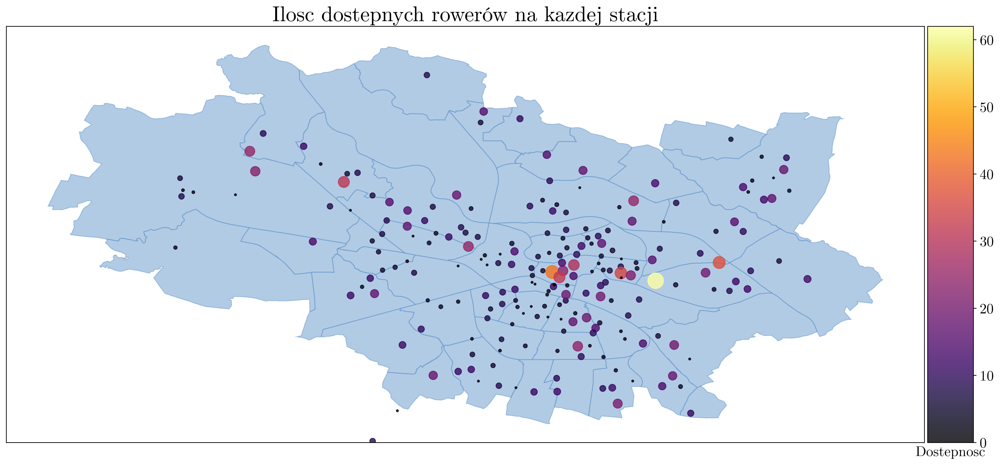

In [19]:
df_bikes_available = df_geo_location_bicycle_dataset[
    ["station_name", "number_of_bikes_available"]
]
df_bikes_available = df_bikes_available.set_index("station_name")
bikes_available_dict = df_bikes_available.to_dict()["number_of_bikes_available"]

fig = plt.figure(figsize=(16, 9), dpi=400)
plt.title("Ilosc dostepnych rowerów na kazdej stacji", fontsize=24)
ax = fig.gca()

for i in range(len(polygons)):
    coordinates = polygons[i]["geometry"]["coordinates"]
    poly = {"type": "Polygon", "coordinates": coordinates}
    ax.add_patch(PolygonPatch(poly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2))
    ax.axis("scaled")

nodes_collection = nx.draw_networkx_nodes(
    G=graph,
    pos=stations_positions,
    nodelist=list(bikes_available_dict.keys()),
    alpha=0.8,
    ax=ax,
    node_size=[5 * bikes_available_dict[node] for node in bikes_available_dict],
    node_color=[bikes_available_dict[node] for node in bikes_available_dict],
    cmap="inferno",
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

color_bar = plt.colorbar(nodes_collection, cax=cax)
color_bar.ax.set_xlabel("Dostepnosc")
plt.tight_layout()
plt.savefig(
    "../images/map/Wroclaw_bikes_network_availability.png",
    bbox_inches="tight",
    dpi=400,
)

In [20]:
sorted(bikes_available_dict.items(), key=lambda x: x[1], reverse=True)[:10]

[('Wróblewskiego (ZOO)', 62),
 ('Rynek', 43),
 ('Mickiewicza / pętla tramwajowa', 37),
 ('Janiszewskiego (PWr)', 35),
 ('Szewska / Kazimierza Wielkiego', 32),
 ('Mrągowska / Rolna', 31),
 ('Piaskowa / św. Ducha', 29),
 ('Legnicka (Park Magnolia)', 25),
 ('Koszarowa / UWr', 25),
 ('Stabłowicka / Główna', 25)]

# Bike racks

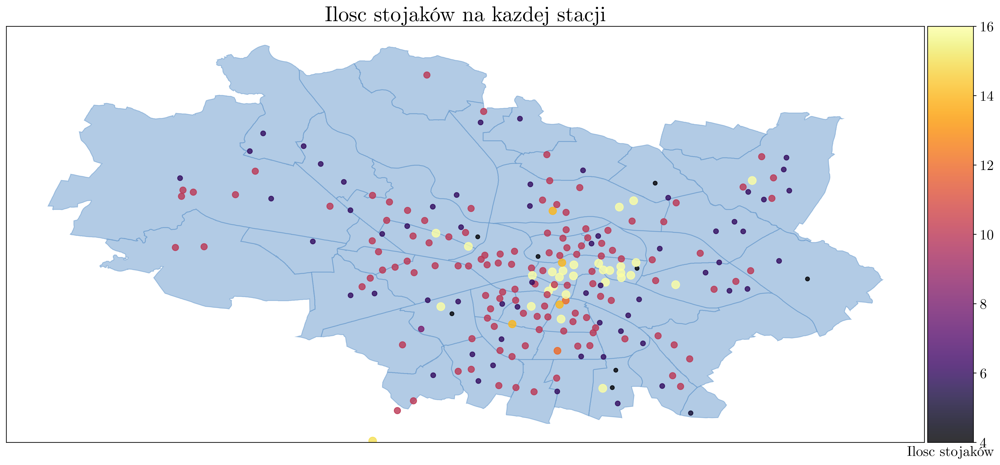

In [21]:
df_bike_racks_available = df_geo_location_bicycle_dataset[
    ["station_name", "number_of_bikes_racks"]
]
df_bike_racks_available = df_bike_racks_available.set_index("station_name")
bike_racks_available_dict = df_bike_racks_available.to_dict()["number_of_bikes_racks"]

fig = plt.figure(figsize=(16, 9), dpi=400)
plt.title("Ilosc stojaków na kazdej stacji", fontsize=24)
ax = fig.gca()

for i in range(len(polygons)):
    coordinates = polygons[i]["geometry"]["coordinates"]
    poly = {"type": "Polygon", "coordinates": coordinates}
    ax.add_patch(PolygonPatch(poly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2))
    ax.axis("scaled")

nodes_collection = nx.draw_networkx_nodes(
    G=graph,
    pos=stations_positions,
    nodelist=list(bike_racks_available_dict.keys()),
    alpha=0.8,
    ax=ax,
    node_size=[
        5 * bike_racks_available_dict[node] for node in bike_racks_available_dict
    ],
    node_color=[bike_racks_available_dict[node] for node in bike_racks_available_dict],
    cmap="inferno",
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

color_bar = plt.colorbar(nodes_collection, cax=cax)
color_bar.ax.set_xlabel("Ilosc stojaków")
plt.tight_layout()
plt.savefig(
    "../images/map/Wroclaw_bikes_network_racks.png",
    bbox_inches="tight",
    dpi=400,
)

In [22]:
sorted(bike_racks_available_dict.items(), key=lambda x: x[1], reverse=True)[:10]

[('Plac Dominikański (Galeria Dominikańska)', 16.0),
 ('Rynek', 16.0),
 ('Dworzec Główny', 16.0),
 ('Rondo Reagana', 16.0),
 ('Grabiszyńska / Aleja Hallera', 16.0),
 ('Szczęśliwa (Sky Tower)', 16.0),
 ('Na Grobli (PWr - Geocentrum)', 16.0),
 ('Lotnicza / Na Ostatnim Groszu', 16.0),
 ('Kamienna / Borowska (Aquapark)', 16.0),
 ('Wyszyńskiego / Szczytnicka', 16.0)]

# Wybrane grafy dla rowerów o wysokich i niskich średnich czasach przejazdu.

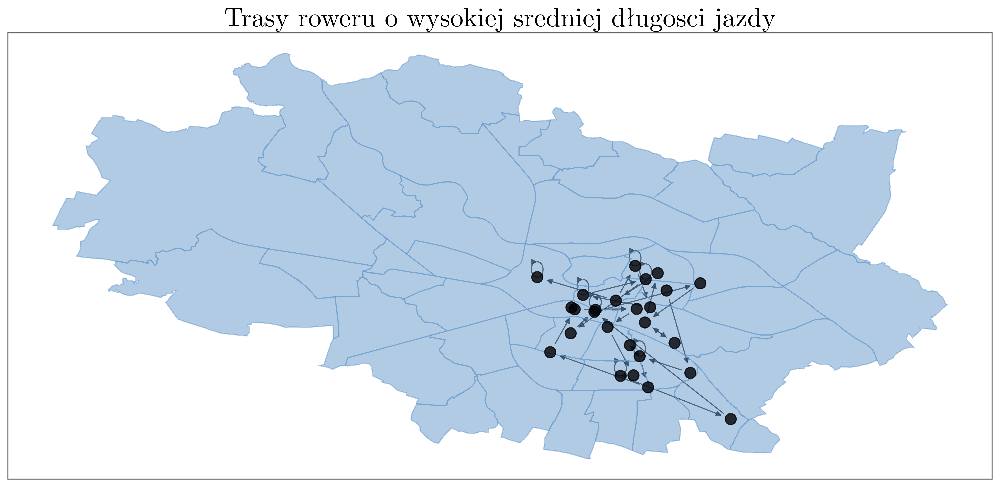

In [23]:
graph_high_average_travel_time = get_graph_for_bike(
    data=df_bicycle_dataset, bike_number=651184
)
nodes_high_average_travel_time = graph_high_average_travel_time.nodes
high_average_travel_time_positions = {
    k: stations_positions[k]
    for k in nodes_high_average_travel_time
    if k in stations_positions
}

fig = plt.figure(figsize=(16, 9), dpi=400)
plt.title("Trasy roweru o wysokiej sredniej długosci jazdy", fontsize=24)
ax = fig.gca()

for i in range(len(polygons)):
    coordinates = polygons[i]["geometry"]["coordinates"]
    poly = {"type": "Polygon", "coordinates": coordinates}
    ax.add_patch(PolygonPatch(poly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2))
    ax.axis("scaled")

nodes_collection = nx.draw_networkx_nodes(
    G=graph_high_average_travel_time,
    pos=high_average_travel_time_positions,
    nodelist=nodes_high_average_travel_time,
    alpha=0.8,
    ax=ax,
    node_size=100,
    node_color=[1 for node in nodes_high_average_travel_time],
    cmap="inferno",
)
nx.draw_networkx_edges(
    G=graph_high_average_travel_time,
    pos=high_average_travel_time_positions,
    alpha=0.8,
    arrows=True,
)

plt.savefig(
    "../images/map/Wroclaw_bikes_network_high_average_travel_time.png",
    bbox_inches="tight",
    dpi=400,
)

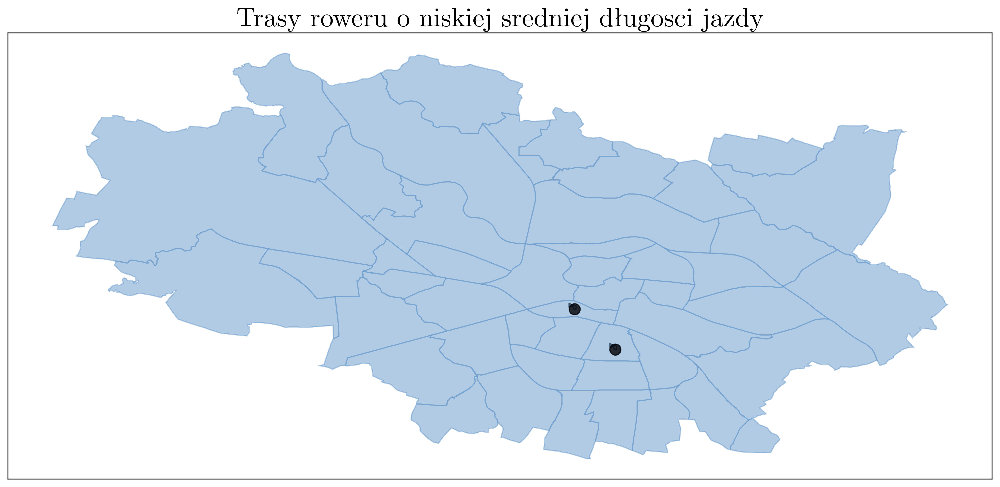

In [24]:
graph_low_average_travel_time = get_graph_for_bike(
    data=df_bicycle_dataset, bike_number=39652
)
nodes_low_average_travel_time = graph_low_average_travel_time.nodes
low_average_travel_time_positions = {
    k: stations_positions[k]
    for k in nodes_low_average_travel_time
    if k in stations_positions
}

fig = plt.figure(figsize=(16, 9), dpi=400)
plt.title("Trasy roweru o niskiej sredniej długosci jazdy", fontsize=24)
ax = fig.gca()

for i in range(len(polygons)):
    coordinates = polygons[i]["geometry"]["coordinates"]
    poly = {"type": "Polygon", "coordinates": coordinates}
    ax.add_patch(PolygonPatch(poly, fc=BLUE, ec=BLUE, alpha=0.5, zorder=2))
    ax.axis("scaled")

nodes_collection = nx.draw_networkx_nodes(
    G=graph_low_average_travel_time,
    pos=low_average_travel_time_positions,
    nodelist=nodes_low_average_travel_time,
    alpha=0.8,
    ax=ax,
    node_size=100,
    node_color=[1 for node in nodes_low_average_travel_time],
    cmap="inferno",
)
nx.draw_networkx_edges(
    G=graph_low_average_travel_time,
    pos=low_average_travel_time_positions,
    alpha=0.8,
    arrows=True,
)

plt.savefig(
    "../images/map/Wroclaw_bikes_network_low_average_travel_time.png",
    bbox_inches="tight",
    dpi=400,
)

# Parametry sieci

In [25]:
# średni stopień wierzchołka
degrees = [graph.degree(node) for node in graph.nodes]
np.mean(degrees)

322.212962962963

In [26]:
# średnia długość najkrótszej ścieżki
nx.average_shortest_path_length(graph)

1.255318690783807

In [27]:
# średni współczynnik grupowania
nx.average_clustering(graph)

0.8461557530327123

In [28]:
# średnica
nx.diameter(graph)

2